#  Analysis of database of top songs (2010-2019)

Objective: to achieve a general exploration of the database (top songs between 2010 and 2019). 

In [1]:
import pandas as pd
import numpy as np
import sys
!pip install pandas-profiling
from pandas_profiling import ProfileReport

C:\Users\JULIAN FONSECA\AppData\Local\Temp\ipykernel_11608\545250964.py:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
df = pd.read_csv("top10s.csv", encoding = "ISO-8859-1")

## Data Understanding

In [3]:
df.sample(20)


,Unnamed: 0,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
214,215,Rude,MAGIC!,pop,2014,144,76,77,-5,31,93,225,4,4,79
421,422,I Know What You Did Last Summer,Shawn Mendes,canadian pop,2016,114,77,68,-5,16,72,224,11,10,57
155,156,Summertime Sadness (Lana Del Rey Vs. Cedric Ge...,Lana Del Rey,art pop,2013,126,81,57,-6,13,11,215,2,6,74
584,585,Beautiful People (feat. Khalid),Ed Sheeran,pop,2019,93,65,64,-8,8,55,198,12,19,86
585,586,Sucker,Jonas Brothers,boy band,2019,138,73,84,-5,11,95,181,4,6,86
468,469,Swish Swish,Katy Perry,dance pop,2017,120,71,84,-5,10,57,243,2,4,73
316,317,I Lived,OneRepublic,dance pop,2015,120,85,59,-5,27,34,235,7,4,67
397,398,Hands To Myself,Selena Gomez,dance pop,2016,111,50,81,-7,34,47,201,1,12,71
561,562,"Girls (feat. Cardi B, Bebe Rexha & Charli XCX)",Rita Ora,dance pop,2018,94,69,73,-4,10,42,221,2,5,64
314,315,I'll Show You,Justin Bieber,canadian pop,2015,192,61,36,-7,18,8,200,5,10,68


In [4]:
df.shape

(603, 15)

In [5]:
df.dtypes

Unnamed: 0     int64
title         object
artist        object
top genre     object
year           int64
bpm            int64
nrgy           int64
dnce           int64
dB             int64
live           int64
val            int64
dur            int64
acous          int64
spch           int64
pop            int64
dtype: object

In [6]:
df.describe()

,Unnamed: 0,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000
mean,302.000000,2014.592040,118.545605,70.504146,64.379768,-5.578773,17.774461,52.225539,224.674959,14.326700,8.358209,66.520730
std,174.215384,2.607057,24.795358,16.310664,13.378718,2.798020,13.102543,22.513020,34.130059,20.766165,7.483162,14.517746
min,1.000000,2010.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,134.000000,0.000000,0.000000,0.000000
25%,151.500000,2013.000000,100.000000,61.000000,57.000000,-6.000000,9.000000,35.000000,202.000000,2.000000,4.000000,60.000000
50%,302.000000,2015.000000,120.000000,74.000000,66.000000,-5.000000,12.000000,52.000000,221.000000,6.000000,5.000000,69.000000
75%,452.500000,2017.000000,129.000000,82.000000,73.000000,-4.000000,24.000000,69.000000,239.500000,17.000000,9.000000,76.000000
max,603.000000,2019.000000,206.000000,98.000000,97.000000,-2.000000,74.000000,98.000000,424.000000,99.000000,48.000000,99.000000


In [7]:
df['title'].value_counts()

A Little Party Never Killed Nobody (All We Got)    2
All I Ask                                          2
Kissing Strangers                                  2
Written in the Stars (feat. Eric Turner)           2
The Hills                                          2
                                                  ..
Finally Found You                                  1
Anything Could Happen                              1
Applause                                           1
Take Back the Night                                1
Kills You Slowly                                   1
Name: title, Length: 584, dtype: int64

# Data Analysis

In [8]:
df.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
598    False
599    False
600    False
601    False
602    False
Length: 603, dtype: bool

In [9]:
df.loc[df.duplicated()]

,Unnamed: 0,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop


In [10]:
df.loc[df['title'].duplicated()]

,Unnamed: 0,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
54,55,Just the Way You Are,Bruno Mars,pop,2011,109,84,64,-5,9,43,221,2,4,78
64,65,Marry You,Bruno Mars,pop,2011,145,83,62,-5,10,48,230,33,4,73
93,94,Written in the Stars (feat. Eric Turner),Tinie Tempah,dance pop,2011,91,95,64,-4,18,57,220,6,7,52
95,96,Castle Walls (feat. Christina Aguilera),T.I.,atl hip hop,2011,80,86,45,-5,26,58,329,7,39,49
152,153,We Are Never Ever Getting Back Together,Taylor Swift,pop,2013,86,68,63,-6,12,75,193,1,9,75
239,240,A Little Party Never Killed Nobody (All We Got),Fergie,dance pop,2014,130,62,76,-6,9,52,241,1,18,65
295,296,Hello,Adele,british soul,2015,158,45,48,-6,9,29,295,34,3,73
322,323,Sugar,Maroon 5,pop,2015,120,79,75,-7,9,88,235,6,3,66
363,364,The Hills,The Weeknd,canadian contemporary r&b,2016,113,56,58,-7,14,14,242,7,5,84
364,365,Love Yourself,Justin Bieber,canadian pop,2016,100,38,61,-10,28,52,234,84,44,83


In [11]:
df.loc[df['artist'].duplicated()]

,Unnamed: 0,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
11,12,Marry You,Bruno Mars,pop,2010,145,83,62,-5,10,48,230,33,4,73
13,14,Telephone,Lady Gaga,dance pop,2010,122,83,83,-6,11,71,221,1,4,73
18,19,Alejandro,Lady Gaga,dance pop,2010,99,80,63,-7,36,37,274,0,5,69
19,20,Your Love Is My Drug,Kesha,dance pop,2010,120,61,83,-4,9,76,187,1,10,69
20,21,Meet Me Halfway,The Black Eyed Peas,dance pop,2010,130,63,80,-7,32,40,284,0,7,68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
598,599,Find U Again (feat. Camila Cabello),Mark Ronson,dance pop,2019,104,66,61,-7,20,16,176,1,3,75
599,600,Cross Me (feat. Chance the Rapper & PnB Rock),Ed Sheeran,pop,2019,95,79,75,-6,7,61,206,21,12,75
600,601,"No Brainer (feat. Justin Bieber, Chance the Ra...",DJ Khaled,dance pop,2019,136,76,53,-5,9,65,260,7,34,70
601,602,Nothing Breaks Like a Heart (feat. Miley Cyrus),Mark Ronson,dance pop,2019,114,79,60,-6,42,24,217,1,7,69


In [12]:
df['artist'].value_counts()

Katy Perry             17
Justin Bieber          16
Rihanna                15
Maroon 5               15
Lady Gaga              14
                       ..
Iggy Azalea             1
5 Seconds of Summer     1
Michael Jackson         1
Disclosure              1
Daddy Yankee            1
Name: artist, Length: 184, dtype: int64

In [13]:
df['top genre'].value_counts()

dance pop                    327
pop                           60
canadian pop                  34
barbadian pop                 15
boy band                      15
electropop                    13
british soul                  11
big room                      10
canadian contemporary r&b      9
neo mellow                     9
art pop                        8
complextro                     6
hip pop                        6
australian dance               6
atl hip hop                    5
australian pop                 5
edm                            5
permanent wave                 4
latin                          4
hip hop                        4
colombian pop                  3
tropical house                 3
brostep                        2
downtempo                      2
electronic trap                2
belgian edm                    2
escape room                    2
folk-pop                       2
electro                        2
indie pop                      2
detroit hi

In [14]:
100*df['top genre'].value_counts()/len(df['top genre'])

dance pop                    54.228856
pop                           9.950249
canadian pop                  5.638474
barbadian pop                 2.487562
boy band                      2.487562
electropop                    2.155887
british soul                  1.824212
big room                      1.658375
canadian contemporary r&b     1.492537
neo mellow                    1.492537
art pop                       1.326700
complextro                    0.995025
hip pop                       0.995025
australian dance              0.995025
atl hip hop                   0.829187
australian pop                0.829187
edm                           0.829187
permanent wave                0.663350
latin                         0.663350
hip hop                       0.663350
colombian pop                 0.497512
tropical house                0.497512
brostep                       0.331675
downtempo                     0.331675
electronic trap               0.331675
belgian edm              

<AxesSubplot: >

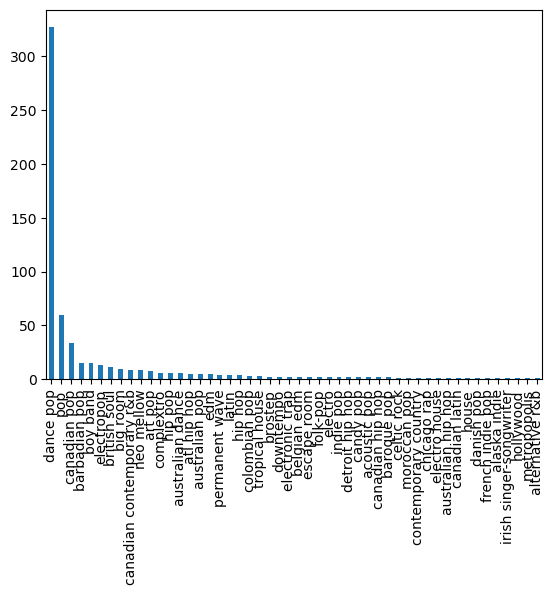

In [15]:
df['top genre'].value_counts().plot(kind="bar")

In [16]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
df.isnull().sum()/df.shape[0]*100

Unnamed: 0    0.0
title         0.0
artist        0.0
top genre     0.0
year          0.0
bpm           0.0
nrgy          0.0
dnce          0.0
dB            0.0
live          0.0
val           0.0
dur           0.0
acous         0.0
spch          0.0
pop           0.0
dtype: float64

In [18]:
100*(df.loc[df.duplicated()])/len(df)

,Unnamed: 0,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop


In [19]:
df.dtypes

Unnamed: 0     int64
title         object
artist        object
top genre     object
year           int64
bpm            int64
nrgy           int64
dnce           int64
dB             int64
live           int64
val            int64
dur            int64
acous          int64
spch           int64
pop            int64
dtype: object

In [20]:
df['top genre'].value_counts()

dance pop                    327
pop                           60
canadian pop                  34
barbadian pop                 15
boy band                      15
electropop                    13
british soul                  11
big room                      10
canadian contemporary r&b      9
neo mellow                     9
art pop                        8
complextro                     6
hip pop                        6
australian dance               6
atl hip hop                    5
australian pop                 5
edm                            5
permanent wave                 4
latin                          4
hip hop                        4
colombian pop                  3
tropical house                 3
brostep                        2
downtempo                      2
electronic trap                2
belgian edm                    2
escape room                    2
folk-pop                       2
electro                        2
indie pop                      2
detroit hi

In [21]:
df.describe()

,Unnamed: 0,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000
mean,302.000000,2014.592040,118.545605,70.504146,64.379768,-5.578773,17.774461,52.225539,224.674959,14.326700,8.358209,66.520730
std,174.215384,2.607057,24.795358,16.310664,13.378718,2.798020,13.102543,22.513020,34.130059,20.766165,7.483162,14.517746
min,1.000000,2010.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,134.000000,0.000000,0.000000,0.000000
25%,151.500000,2013.000000,100.000000,61.000000,57.000000,-6.000000,9.000000,35.000000,202.000000,2.000000,4.000000,60.000000
50%,302.000000,2015.000000,120.000000,74.000000,66.000000,-5.000000,12.000000,52.000000,221.000000,6.000000,5.000000,69.000000
75%,452.500000,2017.000000,129.000000,82.000000,73.000000,-4.000000,24.000000,69.000000,239.500000,17.000000,9.000000,76.000000
max,603.000000,2019.000000,206.000000,98.000000,97.000000,-2.000000,74.000000,98.000000,424.000000,99.000000,48.000000,99.000000
